# Assignment 5 - Video and Real-time Analysis

## Part 1 - Video read/write
I will start with reading a video in and apply some basic tools on it. The video chosen for this part is from pixabay.com. A resource of free video/image and sound clips.

- Read the file “Bangkok.mp4” file using OpenCV. Find the relevant commands to find the video’s metadata and print out following information about the video:
   - Frame Per second (fps)
   - Total number of frames
   - Height and Width of the video

- There are many ways to play this file inside google colab. If you just use OpenCV, it will be shown frame by frame. Another approach is to use embedded version using HTML library. For the rest of the steps, it would be easier to use html version for playing the video.

- Let’s apply some filters on the video file. Use adaptive_theshold_mean and threshold_binary_inv, to create a sketch version of the video. You can use Videowriter command to save the output but it takes quite some time. Instead, only print 3 frames of the video.

In [6]:
# Part 1 Solution
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

from IPython.display import HTML
from base64 import b64encode
from pathlib import Path

In [9]:
# Part 1a: Video Metadata Extraction

# Define the path to the video files relative to the notebook
# Using resolve() to get the absolute path is often safer for OpenCV
video_path = Path('Lab5_files') / 'Bangkok.mp4'
absolute_video_path = video_path.resolve()

# Read the video file
cap = cv2.VideoCapture(str(absolute_video_path))

# Check if the video was opened successfully
if not cap.isOpened():
    print(f"Error: Could not open video file {video_path}")
    print(f"Tried absolute path: {absolute_video_path}")
    print(f"File exists: {absolute_video_path.exists()}")
    print(f"Current Working Directory: {os.getcwd()}")
else:
    print(f"Successfully opened {video_path}")

    # Part 1a: Print video metadata
    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    print(f"Frames Per Second (FPS): {fps}")
    print(f"Total Number of Frames: {total_frames}")
    print(f"Dimensions: {width}x{height}")

Successfully opened Lab5_files/Bangkok.mp4
Frames Per Second (FPS): 25.0
Total Number of Frames: 650
Dimensions: 1280x720


In [10]:
# Part 1b: Play the video using HTML

# We can embed the local video file directly if it's in a format browsers support (mp4 usually works)
mp4 = open(absolute_video_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width={width} height={height} controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

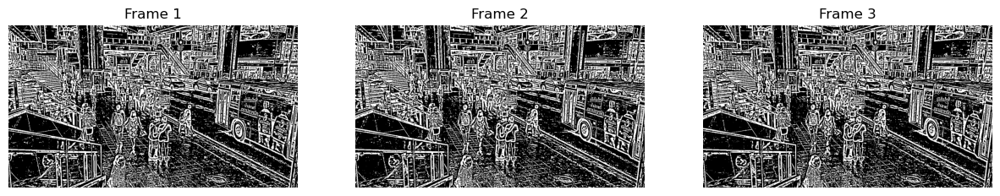

In [7]:
# Part 1c: Apply filters and print 3 frames

# Reset video pointer to start
cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

frames_to_show = 3
frames_shown = 0

# Create a figure to display the frames
plt.figure(figsize=(15, 5))

while cap.isOpened() and frames_shown < frames_to_show:
    ret, frame = cap.read()
    if not ret:
        break
    
    # Convert to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Apply adaptive thresholding
    # adaptive_theshold_mean and threshold_binary_inv
    sketch = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                   cv2.THRESH_BINARY_INV, 11, 2)
    
    # Display the frame
    frames_shown += 1
    plt.subplot(1, 3, frames_shown)
    plt.imshow(sketch, cmap='gray')
    plt.title(f'Frame {frames_shown}')
    plt.axis('off')

plt.show()
cap.release()

### Analysis of Part 1c

In this section, I created a "sketch" effect using **Adaptive Thresholding** by:

1.  **Grayscale Conversion**:
    -   First convert the frame to grayscale (`cv2.cvtColor`). This is a necessary preprocessing step because thresholding operations work on single-channel intensity values, not multi-channel color images.

2.  **Adaptive Thresholding (`cv2.adaptiveThreshold`)**:
    -   Unlike simple global thresholding (which uses one threshold value for the entire image), **adaptive thresholding** calculates the threshold for a pixel based on a small region around it.
    -   Used `cv2.ADAPTIVE_THRESH_MEAN_C`, which sets the threshold as the mean of the neighborhood area minus a constant `C`.
    -   **Why it looks like a sketch**: This technique effectively acts as a local edge detector. It highlights pixels that are significantly different from their neighbors (edges) while suppressing regions with constant intensity (flat areas).
    -   Used `cv2.THRESH_BINARY_INV` to invert the result. This typically results in white edges on a black background (or vice versa depending on the original image intensity), mimicking the strokes of a pencil sketch.

This approach is robust to varying lighting conditions in the video because the threshold is determined locally rather than globally.

## Part 2 - Pose estimation in video
Return to the functions that were provided in previous assignments to estimate the pose in images. This time, we want to experience it in a video file. For that, we will follow the approach in https://github.com/tensorflow/hub/tree/master/examples and estimate the pose of the girl in video. The format of the video this time is gif.

In [ ]:
# Part 2 Solution
# Your code here


## Part 3 - Using webcam video
Now, we want to use webcam and make object detection on real-time. As you have seen in previous modules, the first step is to have a pre-trained model and use it for future classifications. My recommendation is to use the YOLO 11 model for this part (yolov11n.pt).

Another piece that we need is a script to connect our webcam to python to make a live object detection application. We will be using the code snippet for Camera Capture which runs JavaScript code to utilize your computer's webcam. Please refer to previous assignment to copy the code here.

Use a code to detect the camera and take a photo and finally detect the objects in the photo.

In [ ]:
# Part 3 Solution
# Your code here


## Extra credit
Design a Real-Time pose estimator.

In [ ]:
# Extra Credit Solution
# Your code here
